## project

In [78]:
import xarray as xr
import numpy as np
import os
import act
from matplotlib import pyplot as plt
import matplotlib.dates as mdates
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy.spatial import cKDTree
import pandas as pd
from wrf import (getvar, CoordPair, vertcross, latlon_coords, to_np, destagger)
import glob
import netCDF4 as nc
import matplotlib as mpl

mpl.rcParams['font.size'] = 14  
plt.rcParams.update({
    "font.size": 14,           
    "axes.titlesize": 16,      
    "axes.labelsize": 14,      
    "xtick.labelsize": 14,     
    "ytick.labelsize": 14,     
    "legend.fontsize": 14,     
    "figure.titlesize": 14     
})

username = 'jcai'
token = '5a89db86d5d858ea'

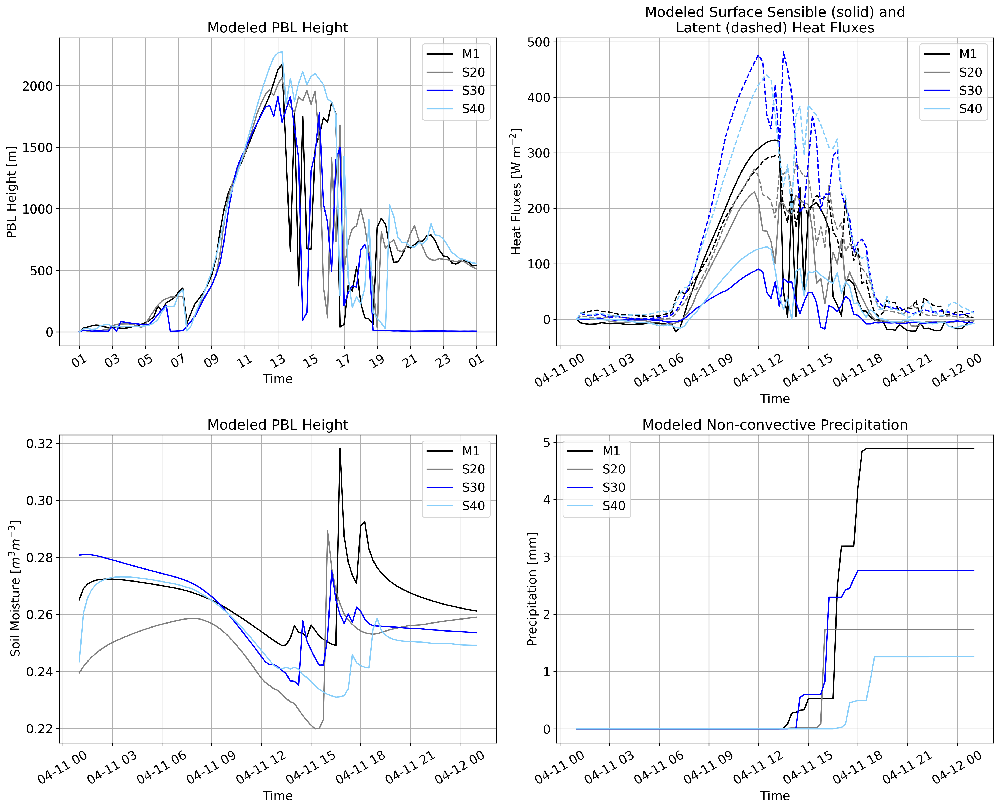

In [81]:
# Set paths to model outputs
path_head = '/data/project/ARM_Summer_School_2025/model/wrf/'
case_days = ['2025041106/'] #15min; 10min 
for case_day in case_days:
    ds_wrf = xr.open_mfdataset(os.path.join(path_head+case_day+'run/wrfout_d01*'),concat_dim='Time',combine='nested')
    # ds_wrf
    # Create a dictionary for our ARM sites so we can easily find them in the model
    # Pull static lat/lon at first time step
    lat2d = ds_wrf['XLAT'].isel(Time=0)
    lon2d = ds_wrf['XLONG'].isel(Time=0)
    # Flatten and build KDTree
    flat_coords = np.column_stack((lat2d.values.ravel(), lon2d.values.ravel()))
    tree = cKDTree(flat_coords)
    # ARM site locations
    target_lat = [34.3425, 34.6538, 34.3848, 34.1788]
    target_lon = [-87.3382, -87.2927, -86.9279, -87.4539]
    target_coords = np.column_stack((target_lat, target_lon))
    # Find nearest indices
    _, flat_idx = tree.query(target_coords)
    i_indices, j_indices = np.unravel_index(flat_idx, lat2d.shape)
    # Create dict of site names to datasets
    site_names = ['M1', 'S20', 'S30', 'S40']
    site_datasets = {}
    for name, i, j in zip(site_names, i_indices, j_indices):
        site_datasets[name] = ds_wrf.isel(south_north=i, west_east=j).expand_dims(site=[name])
    # Subset the original WRF dataset so that it includes information for just our sites
    ds_wrf_bnf_site = xr.concat(site_datasets.values(), dim='site')
    ds_wrf_bnf_site

    var1 = ds_wrf_bnf_site['PBLH']
    var1a = ds_wrf_bnf_site['HFX'] # surface sensible heat flux
    var1b = ds_wrf_bnf_site['LH'] # surface latent heat flux
    var1c = ds_wrf_bnf_site['LWP'] # liquid water path
    LU_INDEX  = ds_wrf_bnf_site['LU_INDEX']
    VEGFRA = ds_wrf_bnf_site['VEGFRA']
    PCT_PFT = ds_wrf_bnf_site['PCT_PFT']
    LAI = ds_wrf_bnf_site['LAI']
    EMISS = ds_wrf_bnf_site['EMISS']
    ALBEDO = ds_wrf_bnf_site['ALBEDO']
    SMOIS = ds_wrf_bnf_site['SMOIS']
    RAINC = ds_wrf_bnf_site['RAINC']
    RAINNC = ds_wrf_bnf_site['RAINNC']
    xtime = pd.to_datetime(var1['XTIME'].values) - pd.Timedelta(hours=5)

    # Make the plot
    plt.figure(figsize=(16, 13),dpi=300)
    cols = ['k','gray','b','lightskyblue']
    ######################## Subplot 1 ########################
    # Sensible and latent heat fluxes
    plt.subplot(2,2,1)
    count = 0
    for site in var1.site.values:
        plt.plot(xtime, var1.sel(site=site), c=cols[count], label=site)
        count+=1
    plt.xticks(rotation=30)
    plt.xlabel("Time")
    plt.ylabel("PBL Height [m]")
    plt.title("Modeled PBL Height")
    plt.legend()
    plt.grid(True)
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
    plt.gca().xaxis.set_major_locator(mdates.HourLocator(interval=2))
    ######################## Subplot 2 ########################
    plt.subplot(2,2,2)
    count = 0
    for site in var1a.site.values:
        plt.plot(xtime, var1a.sel(site=site), c=cols[count], label=site)
        plt.plot(xtime, var1b.sel(site=site), c=cols[count], ls='--')
        count+=1
    plt.xticks(rotation=30)
    plt.xlabel("Time")
    plt.ylabel("Heat Fluxes [W m$^{-2}$]")
    plt.title("Modeled Surface Sensible (solid) and\nLatent (dashed) Heat Fluxes")
    plt.legend()
    plt.grid(True)
    ######################## Subplot 3 ########################
    # Sensible and latent heat fluxes
    plt.subplot(2,2,3)
    count = 0
    for site in var1.site.values:
        plt.plot(xtime, SMOIS.sel(site=site)[:,0], c=cols[count], label=site)
        count+=1
    plt.xticks(rotation=30)
    plt.xlabel("Time")
    plt.ylabel("Soil Moisture [$m^3 m^{-3}$]")
    plt.title("Modeled PBL Height")
    plt.legend()
    plt.grid(True)

    # Liquid water path
    plt.subplot(2,2,4)
    count = 0
    for site in var1.site.values:
        #plt.plot(var2['XTIME'], var2.sel(site=site), c=cols[count], label=site)
        plt.plot(xtime, RAINNC.sel(site=site), c=cols[count], label=site)
        count+=1
    plt.xticks(rotation=30)
    plt.xlabel("Time")
    #plt.ylabel("Liquid Water Path [kg m$^{-2}$]")
    #plt.title("Modeled Liquid Water Path (solid) at ARM Sites")
    plt.ylabel("Precipitation [mm]")
    plt.title("Modeled Non-convective Precipitation")
    plt.legend()
    plt.grid(True)
    #plt.gcf().autofmt_xdate() # clean up labels
    plt.tight_layout()
    plt.show()

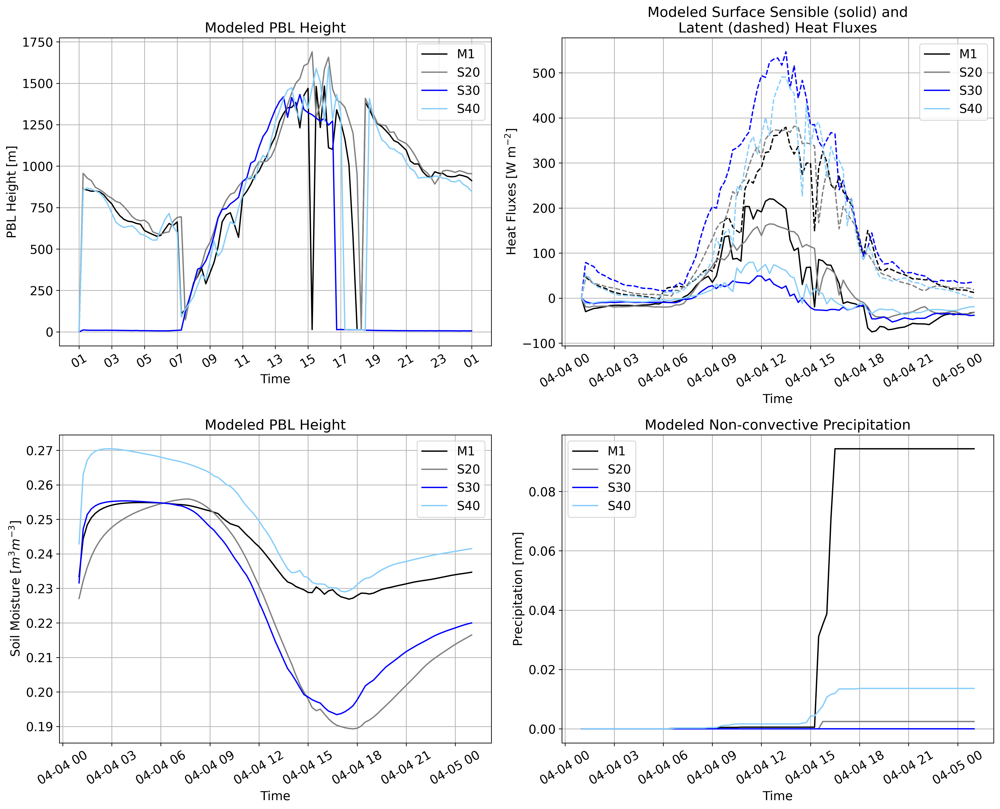

In [82]:
# Set paths to model outputs
path_head = '/data/project/ARM_Summer_School_2025/model/wrf/'
case_days = ['2025040406/'] #15min; 10min 
for case_day in case_days:
    ds_wrf = xr.open_mfdataset(os.path.join(path_head+case_day+'run/wrfout_d01*'),concat_dim='Time',combine='nested')
    # ds_wrf
    # Create a dictionary for our ARM sites so we can easily find them in the model
    # Pull static lat/lon at first time step
    lat2d = ds_wrf['XLAT'].isel(Time=0)
    lon2d = ds_wrf['XLONG'].isel(Time=0)
    # Flatten and build KDTree
    flat_coords = np.column_stack((lat2d.values.ravel(), lon2d.values.ravel()))
    tree = cKDTree(flat_coords)
    # ARM site locations
    target_lat = [34.3425, 34.6538, 34.3848, 34.1788]
    target_lon = [-87.3382, -87.2927, -86.9279, -87.4539]
    target_coords = np.column_stack((target_lat, target_lon))
    # Find nearest indices
    _, flat_idx = tree.query(target_coords)
    i_indices, j_indices = np.unravel_index(flat_idx, lat2d.shape)
    # Create dict of site names to datasets
    site_names = ['M1', 'S20', 'S30', 'S40']
    site_datasets = {}
    for name, i, j in zip(site_names, i_indices, j_indices):
        site_datasets[name] = ds_wrf.isel(south_north=i, west_east=j).expand_dims(site=[name])
    # Subset the original WRF dataset so that it includes information for just our sites
    ds_wrf_bnf_site = xr.concat(site_datasets.values(), dim='site')
    ds_wrf_bnf_site

    var1 = ds_wrf_bnf_site['PBLH']
    var1a = ds_wrf_bnf_site['HFX'] # surface sensible heat flux
    var1b = ds_wrf_bnf_site['LH'] # surface latent heat flux
    var1c = ds_wrf_bnf_site['LWP'] # liquid water path
    LU_INDEX  = ds_wrf_bnf_site['LU_INDEX']
    VEGFRA = ds_wrf_bnf_site['VEGFRA']
    PCT_PFT = ds_wrf_bnf_site['PCT_PFT']
    LAI = ds_wrf_bnf_site['LAI']
    EMISS = ds_wrf_bnf_site['EMISS']
    ALBEDO = ds_wrf_bnf_site['ALBEDO']
    SMOIS = ds_wrf_bnf_site['SMOIS']
    RAINC = ds_wrf_bnf_site['RAINC']
    RAINNC = ds_wrf_bnf_site['RAINNC']
    xtime = pd.to_datetime(var1['XTIME'].values) - pd.Timedelta(hours=5)

    # Make the plot
    plt.figure(figsize=(16, 13),dpi=300)
    cols = ['k','gray','b','lightskyblue']
    ######################## Subplot 1 ########################
    # Sensible and latent heat fluxes
    plt.subplot(2,2,1)
    count = 0
    for site in var1.site.values:
        plt.plot(xtime, var1.sel(site=site), c=cols[count], label=site)
        count+=1
    plt.xticks(rotation=30)
    plt.xlabel("Time")
    plt.ylabel("PBL Height [m]")
    plt.title("Modeled PBL Height")
    plt.legend()
    plt.grid(True)
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
    plt.gca().xaxis.set_major_locator(mdates.HourLocator(interval=2))
    ######################## Subplot 2 ########################
    plt.subplot(2,2,2)
    count = 0
    for site in var1a.site.values:
        plt.plot(xtime, var1a.sel(site=site), c=cols[count], label=site)
        plt.plot(xtime, var1b.sel(site=site), c=cols[count], ls='--')
        count+=1
    plt.xticks(rotation=30)
    plt.xlabel("Time")
    plt.ylabel("Heat Fluxes [W m$^{-2}$]")
    plt.title("Modeled Surface Sensible (solid) and\nLatent (dashed) Heat Fluxes")
    plt.legend()
    plt.grid(True)
    ######################## Subplot 3 ########################
    # Sensible and latent heat fluxes
    plt.subplot(2,2,3)
    count = 0
    for site in var1.site.values:
        plt.plot(xtime, SMOIS.sel(site=site)[:,0], c=cols[count], label=site)
        count+=1
    plt.xticks(rotation=30)
    plt.xlabel("Time")
    plt.ylabel("Soil Moisture [$m^3 m^{-3}$]")
    plt.title("Modeled PBL Height")
    plt.legend()
    plt.grid(True)

    # Liquid water path
    plt.subplot(2,2,4)
    count = 0
    for site in var1.site.values:
        #plt.plot(var2['XTIME'], var2.sel(site=site), c=cols[count], label=site)
        plt.plot(xtime, RAINNC.sel(site=site), c=cols[count], label=site)
        count+=1
    plt.xticks(rotation=30)
    plt.xlabel("Time")
    #plt.ylabel("Liquid Water Path [kg m$^{-2}$]")
    #plt.title("Modeled Liquid Water Path (solid) at ARM Sites")
    plt.ylabel("Precipitation [mm]")
    plt.title("Modeled Non-convective Precipitation")
    plt.legend()
    plt.grid(True)
    #plt.gcf().autofmt_xdate() # clean up labels
    plt.tight_layout()
    plt.show()

In [71]:
RAINNC = ds_wrf_bnf_site['RAINNC']

In [73]:
RAINNC

<xarray.DataArray 'RAINNC' (site: 4, Time: 97)> Size: 2kB
dask.array<concatenate, shape=(4, 97), dtype=float32, chunksize=(1, 1), chunktype=numpy.ndarray>
Coordinates:
  * site     (site) object 32B 'M1' 'S20' 'S30' 'S40'
    XLAT     (site, Time) float32 2kB dask.array<chunksize=(1, 1), meta=np.ndarray>
    XLONG    (site, Time) float32 2kB dask.array<chunksize=(1, 1), meta=np.ndarray>
    XTIME    (Time) datetime64[ns] 776B dask.array<chunksize=(1,), meta=np.ndarray>
Dimensions without coordinates: Time
Attributes:
    FieldType:    104
    MemoryOrder:  XY 
    description:  ACCUMULATED TOTAL GRID SCALE PRECIPITATION
    units:        mm
    stagger:

In [66]:
ds_wrf

<xarray.Dataset> Size: 981GB
Dimensions:                (Time: 97, south_north: 1000, west_east: 1000,
                            bottom_top: 102, bottom_top_stag: 103,
                            soil_layers_stag: 10, west_east_stag: 1001,
                            south_north_stag: 1001, pft_fraction_stag: 17,
                            seed_dim_stag: 2, subgrid_stag: 10)
Coordinates:
    XLAT                   (Time, south_north, west_east) float32 388MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    XLONG                  (Time, south_north, west_east) float32 388MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    XTIME                  (Time) datetime64[ns] 776B dask.array<chunksize=(1,), meta=np.ndarray>
    XLAT_U                 (Time, south_north, west_east_stag) float32 388MB dask.array<chunksize=(1, 1000, 1001), meta=np.ndarray>
    XLONG_U                (Time, south_north, west_east_stag) float32 388MB dask.array<chunksize=(1, 1000, 1001), meta=np.ndarray>
    XLAT_V                 (Time, south_north_stag, west_east) float32 388MB dask.array<chunksize=(1, 1001, 1000), meta=np.ndarray>
    XLONG_V                (Time, south_north_stag, west_east) float32 388MB dask.array<chunksize=(1, 1001, 1000), meta=np.ndarray>
Dimensions without coordinates: Time, south_north, west_east, bottom_top,
                                bottom_top_stag, soil_layers_stag,
                                west_east_stag, south_north_stag,
                                pft_fraction_stag, seed_dim_stag, subgrid_stag
Data variables: (12/246)
    Times                  (Time) |S19 2kB dask.array<chunksize=(1,), meta=np.ndarray>
    LU_INDEX               (Time, south_north, west_east) float32 388MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    ZNU                    (Time, bottom_top) float32 40kB dask.array<chunksize=(1, 102), meta=np.ndarray>
    ZNW                    (Time, bottom_top_stag) float32 40kB dask.array<chunksize=(1, 103), meta=np.ndarray>
    ZS                     (Time, soil_layers_stag) float32 4kB dask.array<chunksize=(1, 10), meta=np.ndarray>
    DZS                    (Time, soil_layers_stag) float32 4kB dask.array<chunksize=(1, 10), meta=np.ndarray>
    ...                     ...
    PERT_T                 (Time, bottom_top, south_north, west_east) float32 40GB dask.array<chunksize=(1, 102, 1000, 1000), meta=np.ndarray>
    M_PBLH                 (Time, south_north, west_east) float32 388MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    LANDMASK               (Time, south_north, west_east) float32 388MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    LAKEMASK               (Time, south_north, west_east) float32 388MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    SST                    (Time, south_north, west_east) float32 388MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    SST_INPUT              (Time, south_north, west_east) float32 388MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
Attributes: (12/134)
    TITLE:                            OUTPUT FROM WRF V4.5.2 MODEL
    START_DATE:                      2025-04-11_06:00:00
    SIMULATION_START_DATE:           2025-04-11_06:00:00
    WEST-EAST_GRID_DIMENSION:        1001
    SOUTH-NORTH_GRID_DIMENSION:      1001
    BOTTOM-TOP_GRID_DIMENSION:       103
    ...                              ...
    ISLAKE:                          21
    ISICE:                           15
    ISURBAN:                         13
    ISOILWATER:                      14
    HYBRID_OPT:                      0
    ETAC:                            0.0

In [52]:
LU_INDEX.values[:,0]
#Deciduous Broadleaf Forest; Grasslands; Croplands; Cropland/Natural Vegetation Mosaic

array([ 4., 10., 12., 14.], dtype=float32)

In [53]:
VEGFRA.values[:,0]

array([61.913937, 48.616795, 53.90731 , 47.909145], dtype=float32)

In [54]:
# (4, 115, 17)	
PCT_PFT.values[:,10,:]

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0.]], dtype=float32)

In [55]:
LAI.values[:,0]

array([2.038014 , 1.1837474, 1.6651636, 2.1139603], dtype=float32)

In [56]:
EMISS.values[:,0]

array([0.93, 0.92, 0.92, 0.92], dtype=float32)

In [57]:
ALBEDO.values[:,0]

array([0.17, 0.23, 0.2 , 0.2 ], dtype=float32)

In [58]:
ds_wrf

<xarray.Dataset> Size: 981GB
Dimensions:                (Time: 97, south_north: 1000, west_east: 1000,
                            bottom_top: 102, bottom_top_stag: 103,
                            soil_layers_stag: 10, west_east_stag: 1001,
                            south_north_stag: 1001, pft_fraction_stag: 17,
                            seed_dim_stag: 2, subgrid_stag: 10)
Coordinates:
    XLAT                   (Time, south_north, west_east) float32 388MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    XLONG                  (Time, south_north, west_east) float32 388MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    XTIME                  (Time) datetime64[ns] 776B dask.array<chunksize=(1,), meta=np.ndarray>
    XLAT_U                 (Time, south_north, west_east_stag) float32 388MB dask.array<chunksize=(1, 1000, 1001), meta=np.ndarray>
    XLONG_U                (Time, south_north, west_east_stag) float32 388MB dask.array<chunksize=(1, 1000, 1001), meta=np.ndarray>
    XLAT_V                 (Time, south_north_stag, west_east) float32 388MB dask.array<chunksize=(1, 1001, 1000), meta=np.ndarray>
    XLONG_V                (Time, south_north_stag, west_east) float32 388MB dask.array<chunksize=(1, 1001, 1000), meta=np.ndarray>
Dimensions without coordinates: Time, south_north, west_east, bottom_top,
                                bottom_top_stag, soil_layers_stag,
                                west_east_stag, south_north_stag,
                                pft_fraction_stag, seed_dim_stag, subgrid_stag
Data variables: (12/246)
    Times                  (Time) |S19 2kB dask.array<chunksize=(1,), meta=np.ndarray>
    LU_INDEX               (Time, south_north, west_east) float32 388MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    ZNU                    (Time, bottom_top) float32 40kB dask.array<chunksize=(1, 102), meta=np.ndarray>
    ZNW                    (Time, bottom_top_stag) float32 40kB dask.array<chunksize=(1, 103), meta=np.ndarray>
    ZS                     (Time, soil_layers_stag) float32 4kB dask.array<chunksize=(1, 10), meta=np.ndarray>
    DZS                    (Time, soil_layers_stag) float32 4kB dask.array<chunksize=(1, 10), meta=np.ndarray>
    ...                     ...
    PERT_T                 (Time, bottom_top, south_north, west_east) float32 40GB dask.array<chunksize=(1, 102, 1000, 1000), meta=np.ndarray>
    M_PBLH                 (Time, south_north, west_east) float32 388MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    LANDMASK               (Time, south_north, west_east) float32 388MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    LAKEMASK               (Time, south_north, west_east) float32 388MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    SST                    (Time, south_north, west_east) float32 388MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    SST_INPUT              (Time, south_north, west_east) float32 388MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
Attributes: (12/134)
    TITLE:                            OUTPUT FROM WRF V4.5.2 MODEL
    START_DATE:                      2025-04-11_06:00:00
    SIMULATION_START_DATE:           2025-04-11_06:00:00
    WEST-EAST_GRID_DIMENSION:        1001
    SOUTH-NORTH_GRID_DIMENSION:      1001
    BOTTOM-TOP_GRID_DIMENSION:       103
    ...                              ...
    ISLAKE:                          21
    ISICE:                           15
    ISURBAN:                         13
    ISOILWATER:                      14
    HYBRID_OPT:                      0
    ETAC:                            0.0

/opt/conda/lib/python3.11/site-packages/act/retrievals/sonde.py:179: UserWarning: Interpolation point out of data bounds encountered
  lfc = mpcalc.lfc(p_sorted[0], t_sorted[0], td_sorted[0])


<xarray.DataArray 'pblht_liu_liang' ()> Size: 8B
array(742.69995117)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Liu-Liang
<xarray.DataArray 'pblht_heffter' ()> Size: 4B
array(306.1, dtype=float32)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Heffter


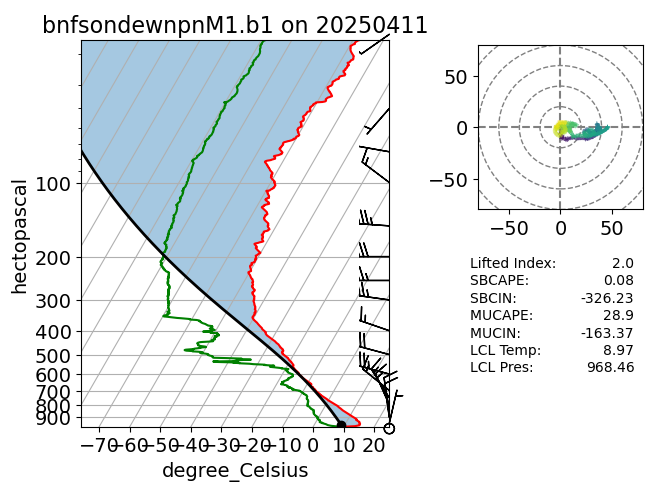

/opt/conda/lib/python3.11/site-packages/act/retrievals/sonde.py:179: UserWarning: Interpolation point out of data bounds encountered
  lfc = mpcalc.lfc(p_sorted[0], t_sorted[0], td_sorted[0])


<xarray.DataArray 'pblht_liu_liang' ()> Size: 8B
array(516.20001221)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Liu-Liang
<xarray.DataArray 'pblht_heffter' ()> Size: 4B
array(306.1, dtype=float32)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Heffter


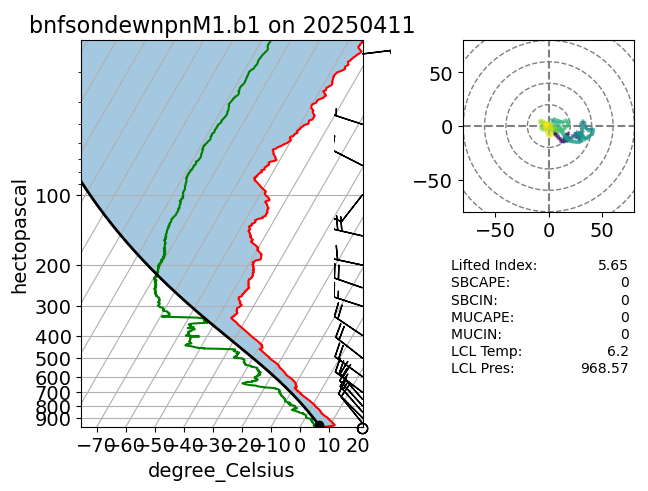

/opt/conda/lib/python3.11/site-packages/act/plotting/skewtdisplay.py:419: UserWarning: Duplicate pressure(s) [18.479999542236328] hPa provided. Output profile includes duplicate temperatures as a result.
  prof = mpcalc.parcel_profile(p, T[0], Td[0]).to('degC')
/opt/conda/lib/python3.11/site-packages/act/retrievals/sonde.py:179: UserWarning: Interpolation point out of data bounds encountered
  lfc = mpcalc.lfc(p_sorted[0], t_sorted[0], td_sorted[0])


<xarray.DataArray 'pblht_liu_liang' ()> Size: 4B
array(3568., dtype=float32)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Liu-Liang
<xarray.DataArray 'pblht_heffter' ()> Size: 4B
array(3568., dtype=float32)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Heffter


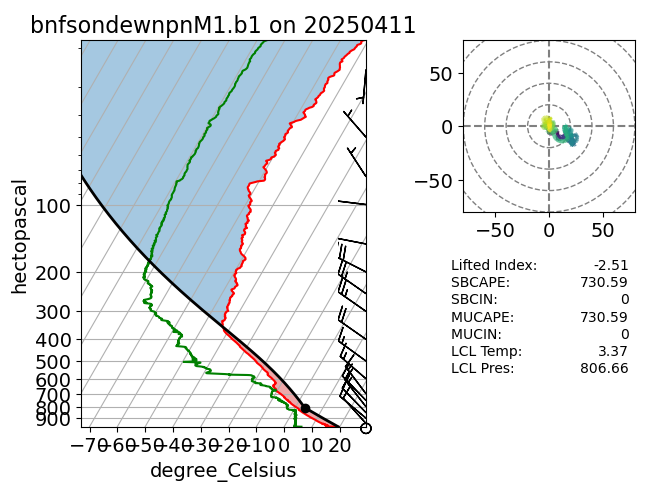

/opt/conda/lib/python3.11/site-packages/act/plotting/skewtdisplay.py:419: UserWarning: Duplicate pressure(s) [19.450000762939453] hPa provided. Output profile includes duplicate temperatures as a result.
  prof = mpcalc.parcel_profile(p, T[0], Td[0]).to('degC')
/opt/conda/lib/python3.11/site-packages/act/retrievals/sonde.py:179: UserWarning: Interpolation point out of data bounds encountered
  lfc = mpcalc.lfc(p_sorted[0], t_sorted[0], td_sorted[0])


<xarray.DataArray 'pblht_liu_liang' ()> Size: 4B
array(466.4, dtype=float32)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Liu-Liang
<xarray.DataArray 'pblht_heffter' ()> Size: 4B
array(379.2, dtype=float32)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Heffter


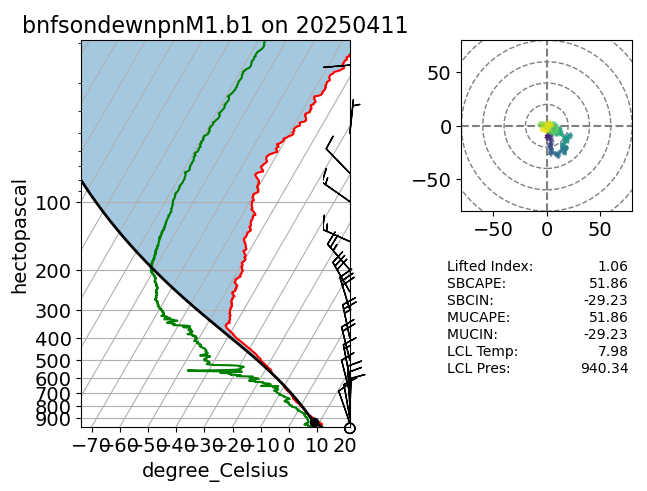

In [83]:
# Read data
filename_sonde = '/data/home/jcai/blimp/bnfsondewnpnM1.b1/bnfsondewnpnM1.b1.20250411.053000.cdf'
ds = act.io.arm.read_arm_netcdf(filename_sonde)
# Plot enhanced Skew-T plot
display = act.plotting.SkewTDisplay(ds)
display.plot_enhanced_skewt(color_field='alt')
act.retrievals.calculate_pbl_liu_liang(ds, temperature='tdry', pressure='pres', windspeed='wspd', height='alt', 
                                       smooth_height=3, land_parameter=True, llj_max_alt=1500.0, llj_max_wspd=2.0)
act.retrievals.calculate_pbl_heffter(ds, temperature='tdry', pressure='pres', height='alt', smooth_height=3, base=5.0)
print(ds['pblht_liu_liang'])
print(ds['pblht_heffter'])
ds.close()
plt.show()

# Read data
filename_sonde = '/data/home/jcai/blimp/bnfsondewnpnM1.b1/bnfsondewnpnM1.b1.20250411.113000.cdf'
ds = act.io.arm.read_arm_netcdf(filename_sonde)
# Plot enhanced Skew-T plot
display = act.plotting.SkewTDisplay(ds)
display.plot_enhanced_skewt(color_field='alt')
act.retrievals.calculate_pbl_liu_liang(ds, temperature='tdry', pressure='pres', windspeed='wspd', height='alt', 
                                       smooth_height=3, land_parameter=True, llj_max_alt=1500.0, llj_max_wspd=2.0)
act.retrievals.calculate_pbl_heffter(ds, temperature='tdry', pressure='pres', height='alt', smooth_height=3, base=5.0)
print(ds['pblht_liu_liang'])
print(ds['pblht_heffter'])
ds.close()
plt.show()

# Read data
filename_sonde = '/data/home/jcai/blimp/bnfsondewnpnM1.b1/bnfsondewnpnM1.b1.20250411.173000.cdf'
ds = act.io.arm.read_arm_netcdf(filename_sonde)
# Plot enhanced Skew-T plot
display = act.plotting.SkewTDisplay(ds)
display.plot_enhanced_skewt(color_field='alt')
act.retrievals.calculate_pbl_liu_liang(ds, temperature='tdry', pressure='pres', windspeed='wspd', height='alt', 
                                       smooth_height=3, land_parameter=True, llj_max_alt=1500.0, llj_max_wspd=2.0)
act.retrievals.calculate_pbl_heffter(ds, temperature='tdry', pressure='pres', height='alt', smooth_height=3, base=5.0)
print(ds['pblht_liu_liang'])
print(ds['pblht_heffter'])
ds.close()
plt.show()

# Read data
filename_sonde = '/data/home/jcai/blimp/bnfsondewnpnM1.b1/bnfsondewnpnM1.b1.20250411.233000.cdf'
ds = act.io.arm.read_arm_netcdf(filename_sonde)
# Plot enhanced Skew-T plot
display = act.plotting.SkewTDisplay(ds)
display.plot_enhanced_skewt(color_field='alt')
act.retrievals.calculate_pbl_liu_liang(ds, temperature='tdry', pressure='pres', windspeed='wspd', height='alt', 
                                       smooth_height=3, land_parameter=True, llj_max_alt=1500.0, llj_max_wspd=2.0)
act.retrievals.calculate_pbl_heffter(ds, temperature='tdry', pressure='pres', height='alt', smooth_height=3, base=5.0)
print(ds['pblht_liu_liang'])
print(ds['pblht_heffter'])
ds.close()
plt.show()

## WRF

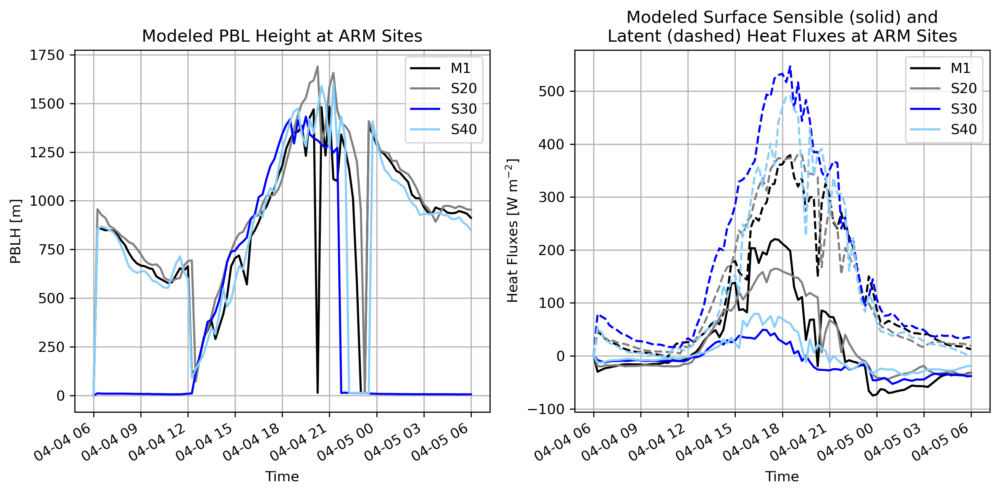

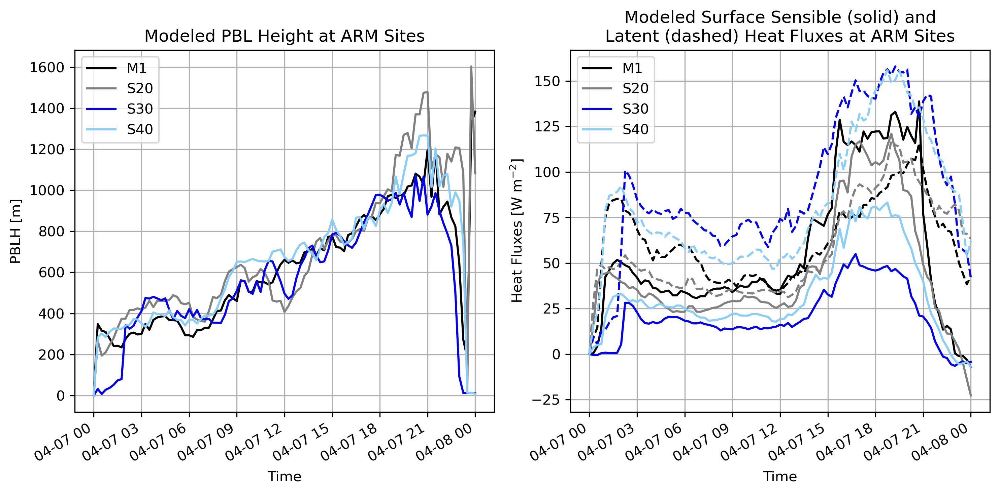

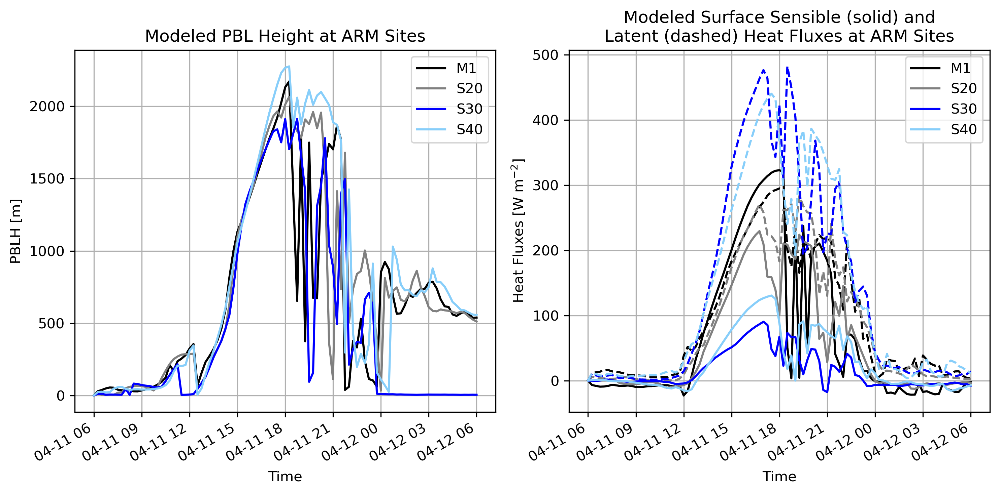

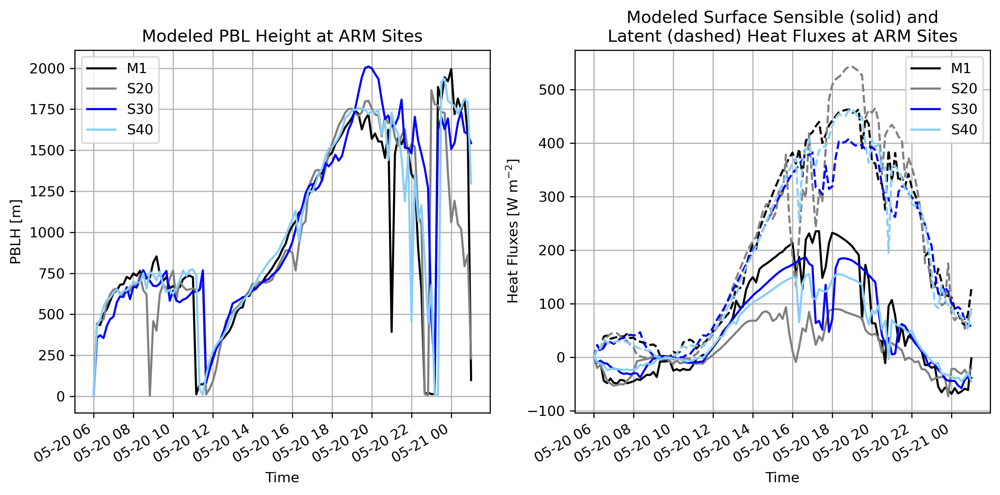

In [27]:
# Set paths to model outputs
path_head = '/data/project/ARM_Summer_School_2025/model/wrf/'
case_days = ['2025040406/', '2025040700/', '2025041106/', '2025052006/'] #15min; 10min 
for case_day in case_days:
    ds_wrf = xr.open_mfdataset(os.path.join(path_head+case_day+'run/wrfout_d01*'),concat_dim='Time',combine='nested')
    # ds_wrf
    # Create a dictionary for our ARM sites so we can easily find them in the model
    # Pull static lat/lon at first time step
    lat2d = ds_wrf['XLAT'].isel(Time=0)
    lon2d = ds_wrf['XLONG'].isel(Time=0)
    # Flatten and build KDTree
    flat_coords = np.column_stack((lat2d.values.ravel(), lon2d.values.ravel()))
    tree = cKDTree(flat_coords)
    # ARM site locations
    target_lat = [34.3425, 34.6538, 34.3848, 34.1788]
    target_lon = [-87.3382, -87.2927, -86.9279, -87.4539]
    target_coords = np.column_stack((target_lat, target_lon))
    # Find nearest indices
    _, flat_idx = tree.query(target_coords)
    i_indices, j_indices = np.unravel_index(flat_idx, lat2d.shape)
    # Create dict of site names to datasets
    site_names = ['M1', 'S20', 'S30', 'S40']
    site_datasets = {}
    for name, i, j in zip(site_names, i_indices, j_indices):
        site_datasets[name] = ds_wrf.isel(south_north=i, west_east=j).expand_dims(site=[name])
    # Subset the original WRF dataset so that it includes information for just our sites
    ds_wrf_bnf_site = xr.concat(site_datasets.values(), dim='site')
    ds_wrf_bnf_site

    var1 = ds_wrf_bnf_site['PBLH']
    var1a = ds_wrf_bnf_site['HFX'] # surface sensible heat flux
    var1b = ds_wrf_bnf_site['LH'] # surface latent heat flux
    var1c = ds_wrf_bnf_site['LWP'] # liquid water path
    LU_INDEX  = ds_wrf_bnf_site['LU_INDEX']
    VEGFRA = ds_wrf_bnf_site['VEGFRA']
    PCT_PFT = ds_wrf_bnf_site['PCT_PFT']
    LAI = ds_wrf_bnf_site['LAI']
    EMISS = ds_wrf_bnf_site['EMISS']
    ALBEDO = ds_wrf_bnf_site['ALBEDO']

    # Make the plot
    plt.figure(figsize=(10, 5),dpi=300)
    cols = ['k','gray','b','lightskyblue']
    ######################## Subplot 1 ########################
    # Sensible and latent heat fluxes
    plt.subplot(1,2,1)
    count = 0
    for site in var1.site.values:
        plt.plot(var1['XTIME'], var1.sel(site=site), c=cols[count], label=site)
        count+=1
    plt.xlabel("Time")
    plt.ylabel("PBLH [m]")
    plt.title("Modeled PBL Height at ARM Sites")
    plt.legend()
    plt.grid(True)
    ######################## Subplot 2 ########################
    plt.subplot(1,2,2)
    count = 0
    for site in var1a.site.values:
        plt.plot(var1a['XTIME'], var1a.sel(site=site), c=cols[count], label=site)
        plt.plot(var1b['XTIME'], var1b.sel(site=site), c=cols[count], ls='--')
        count+=1
    plt.xlabel("Time")
    plt.ylabel("Heat Fluxes [W m$^{-2}$]")
    plt.title("Modeled Surface Sensible (solid) and\nLatent (dashed) Heat Fluxes at ARM Sites")
    plt.legend()
    plt.grid(True)
    plt.gcf().autofmt_xdate() # clean up labels
    plt.tight_layout()
    plt.show()

In [33]:
LU_INDEX.values[:,0]
Deciduous Broadleaf Forest
Grasslands
Croplands
Cropland/Natural Vegetation Mosaic

array([ 4., 10., 12., 14.], dtype=float32)

In [36]:
VEGFRA.values[:,0]

array([88.53206 , 58.966057, 64.93027 , 62.401848], dtype=float32)

In [43]:
# (4, 115, 17)	
PCT_PFT.values[:,10,:]

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0.]], dtype=float32)

In [38]:
LAI.values[:,0]

array([3.9515874, 1.9279239, 2.6371295, 4.248394 ], dtype=float32)

In [39]:
EMISS.values[:,0]

array([0.93 , 0.96 , 0.985, 0.98 ], dtype=float32)

In [40]:
ALBEDO.values[:,0]

array([0.16, 0.19, 0.17, 0.18], dtype=float32)

## First, time series plots comparing the different sites

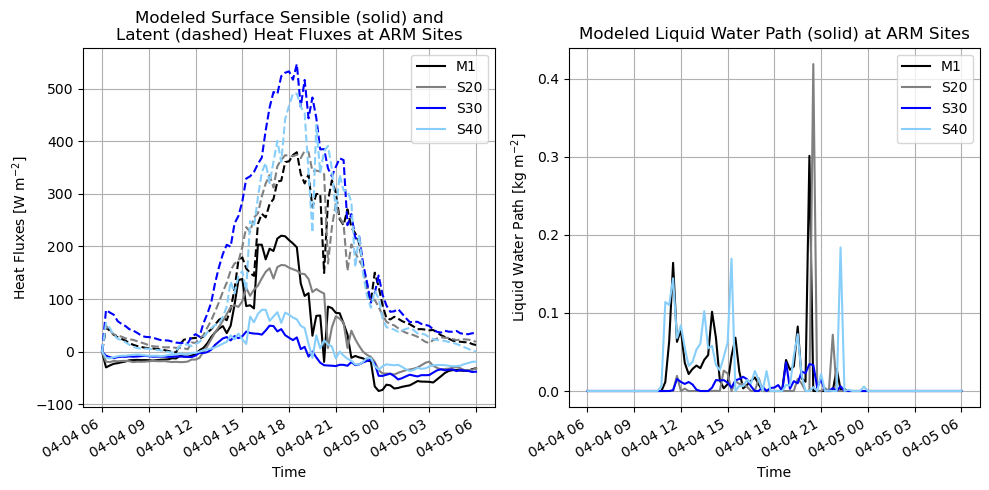

In [19]:
# Make the plot
plt.figure(figsize=(10, 5))
cols = ['k','gray','b','lightskyblue']

######################## Subplot 1 ########################
# Sensible and latent heat fluxes
plt.subplot(1,2,1)
count = 0
for site in var1a.site.values:
    plt.plot(var1a['XTIME'], var1a.sel(site=site), c=cols[count], label=site)
    plt.plot(var1b['XTIME'], var1b.sel(site=site), c=cols[count], ls='--')
    
    count+=1

plt.xlabel("Time")
plt.ylabel("Heat Fluxes [W m$^{-2}$]")
plt.title("Modeled Surface Sensible (solid) and\nLatent (dashed) Heat Fluxes at ARM Sites")
plt.legend()
plt.grid(True)


######################## Subplot 2 ########################
# Liquid water path
plt.subplot(1,2,2)
count = 0
for site in var2.site.values:
    plt.plot(var2['XTIME'], var2.sel(site=site), c=cols[count], label=site)
    #plt.plot(var1b['XTIME'], var1b.sel(site=site), c=cols[count], ls='--')
    
    count+=1

plt.xlabel("Time")
plt.ylabel("Liquid Water Path [kg m$^{-2}$]")
plt.title("Modeled Liquid Water Path (solid) at ARM Sites")
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate() # clean up labels


plt.tight_layout()
plt.show()

## CEIL Ceilometer

In [4]:
# CEIL Ceilometer
dates = ['04-04','04-07','04-11'] #'05-20'

datastream = 'bnfceilM1.b1'
for i in range(len(dates)):
    startdate = '2025-%s'%dates[i]
    enddate = '2025-%sT23:59:59'%dates[i]
    result_sonde = act.discovery.download_arm_data(username, token, datastream, startdate, enddate)

[DOWNLOADING] bnfceilM1.b1.20250404.000000.nc

If you use these data to prepare a publication, please cite:

Zhang, D., Ermold, B., & Morris, V. Ceilometer (CEIL), 2025-04-04 to 2025-04-04,
Bankhead National Forest, AL, USA; Long-term Mobile Facility (BNF), Bankhead
National Forest, AL, AMF3 (Main Site) (M1). Atmospheric Radiation Measurement
(ARM) User Facility. https://doi.org/10.5439/1181954

[DOWNLOADING] bnfceilM1.b1.20250407.000011.nc

If you use these data to prepare a publication, please cite:

Zhang, D., Ermold, B., & Morris, V. Ceilometer (CEIL), 2025-04-07 to 2025-04-07,
Bankhead National Forest, AL, USA; Long-term Mobile Facility (BNF), Bankhead
National Forest, AL, AMF3 (Main Site) (M1). Atmospheric Radiation Measurement
(ARM) User Facility. https://doi.org/10.5439/1181954

[DOWNLOADING] bnfceilM1.b1.20250411.000008.nc

If you use these data to prepare a publication, please cite:

Zhang, D., Ermold, B., & Morris, V. Ceilometer (CEIL), 2025-04-11 to 2025-04-11,
Bankhead Nat

## Radiosonde

In [45]:
# sonde
# Set your username and token here!



# Set the datastream and start/enddates
datastream = 'bnfsondewnpnM1.b1'
startdate = '2025-04-11'
enddate = '2025-04-11T23:59:59'

# Use ACT to easily download the data.  Watch for the data citation!  Show some support
# for ARM's instrument experts and cite their data if you use it in a publication
result_sonde = act.discovery.download_arm_data(username, token, datastream, startdate, enddate)
#/data/project/ARM_Summer_School_2025/bnf

[DOWNLOADING] bnfsondewnpnM1.b1.20250411.173000.cdf
[DOWNLOADING] bnfsondewnpnM1.b1.20250411.053000.cdf
[DOWNLOADING] bnfsondewnpnM1.b1.20250411.113000.cdf
[DOWNLOADING] bnfsondewnpnM1.b1.20250411.233000.cdf

If you use these data to prepare a publication, please cite:

Keeler, E., Burk, K., & Kyrouac, J. Balloon-Borne Sounding System (SONDEWNPN),
2025-04-11 to 2025-04-11, Bankhead National Forest, AL, USA; Long-term Mobile
Facility (BNF), Bankhead National Forest, AL, AMF3 (Main Site) (M1). Atmospheric
Radiation Measurement (ARM) User Facility. https://doi.org/10.5439/1595321



/opt/conda/lib/python3.11/site-packages/act/retrievals/sonde.py:179: UserWarning: Interpolation point out of data bounds encountered
  lfc = mpcalc.lfc(p_sorted[0], t_sorted[0], td_sorted[0])


<xarray.DataArray 'pblht_liu_liang' ()> Size: 8B
array(706.5)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Liu-Liang
<xarray.DataArray 'pblht_heffter' ()> Size: 4B
array(306.1, dtype=float32)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Heffter


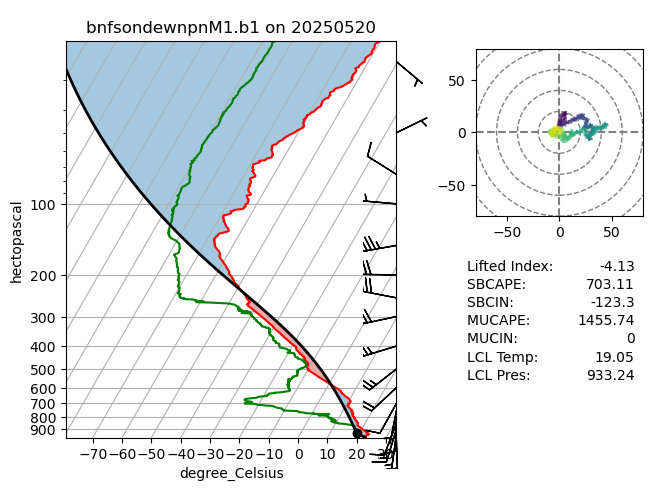

/opt/conda/lib/python3.11/site-packages/act/plotting/skewtdisplay.py:419: UserWarning: Duplicate pressure(s) [15.680000305175781] hPa provided. Output profile includes duplicate temperatures as a result.
  prof = mpcalc.parcel_profile(p, T[0], Td[0]).to('degC')
/opt/conda/lib/python3.11/site-packages/act/retrievals/sonde.py:179: UserWarning: Interpolation point out of data bounds encountered
  lfc = mpcalc.lfc(p_sorted[0], t_sorted[0], td_sorted[0])


<xarray.DataArray 'pblht_liu_liang' ()> Size: 4B
array(1157.4, dtype=float32)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Liu-Liang
<xarray.DataArray 'pblht_heffter' ()> Size: 4B
array(1111.2, dtype=float32)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Heffter


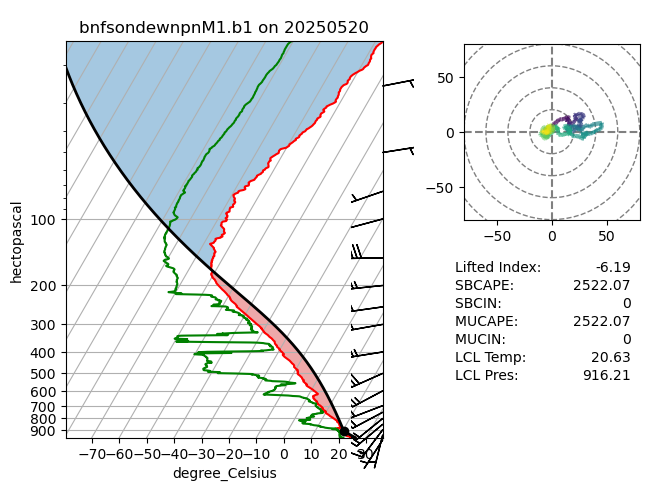

/opt/conda/lib/python3.11/site-packages/act/retrievals/sonde.py:179: UserWarning: Interpolation point out of data bounds encountered
  lfc = mpcalc.lfc(p_sorted[0], t_sorted[0], td_sorted[0])
/opt/conda/lib/python3.11/site-packages/act/retrievals/sonde.py:292: RuntimeWarning: invalid value encountered in divide
  theta_gradient = np.diff(theta) / np.diff(alt)
/opt/conda/lib/python3.11/site-packages/act/retrievals/sonde.py:302: RuntimeWarning: invalid value encountered in divide
  theta_gradient = np.diff(theta) / np.diff(alt / 1000.0)


<xarray.DataArray 'pblht_liu_liang' ()> Size: 4B
array(698., dtype=float32)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Liu-Liang
<xarray.DataArray 'pblht_heffter' ()> Size: 4B
array(2587.7, dtype=float32)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Heffter


/opt/conda/lib/python3.11/site-packages/act/retrievals/sonde.py:480: RuntimeWarning: invalid value encountered in divide
  theta_gradient = np.diff(theta) / np.diff(alt)


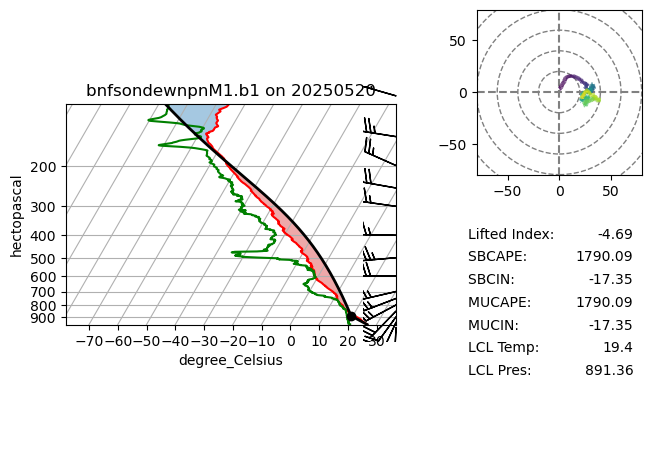

In [11]:
# Read data
filename_sonde = '/data/project/ARM_Summer_School_2025/bnf/bnfsondewnpnM1.b1/bnfsondewnpnM1.b1.20250520.053000.cdf'
ds = act.io.arm.read_arm_netcdf(filename_sonde)
# Plot enhanced Skew-T plot
display = act.plotting.SkewTDisplay(ds)
display.plot_enhanced_skewt(color_field='alt')
act.retrievals.calculate_pbl_liu_liang(ds, temperature='tdry', pressure='pres', windspeed='wspd', height='alt', 
                                       smooth_height=3, land_parameter=True, llj_max_alt=1500.0, llj_max_wspd=2.0)
act.retrievals.calculate_pbl_heffter(ds, temperature='tdry', pressure='pres', height='alt', smooth_height=3, base=5.0)
print(ds['pblht_liu_liang'])
print(ds['pblht_heffter'])
ds.close()
plt.show()

# Read data
filename_sonde = '/data/project/ARM_Summer_School_2025/bnf/bnfsondewnpnM1.b1/bnfsondewnpnM1.b1.20250520.161800.cdf'
ds = act.io.arm.read_arm_netcdf(filename_sonde)
# Plot enhanced Skew-T plot
display = act.plotting.SkewTDisplay(ds)
display.plot_enhanced_skewt(color_field='alt')
act.retrievals.calculate_pbl_liu_liang(ds, temperature='tdry', pressure='pres', windspeed='wspd', height='alt', 
                                       smooth_height=3, land_parameter=True, llj_max_alt=1500.0, llj_max_wspd=2.0)
act.retrievals.calculate_pbl_heffter(ds, temperature='tdry', pressure='pres', height='alt', smooth_height=3, base=5.0)
print(ds['pblht_liu_liang'])
print(ds['pblht_heffter'])
ds.close()
plt.show()

# Read data
filename_sonde = '/data/project/ARM_Summer_School_2025/bnf/bnfsondewnpnM1.b1/bnfsondewnpnM1.b1.20250520.233000.cdf'
ds = act.io.arm.read_arm_netcdf(filename_sonde)
# Plot enhanced Skew-T plot
display = act.plotting.SkewTDisplay(ds)
display.plot_enhanced_skewt(color_field='alt')
act.retrievals.calculate_pbl_liu_liang(ds, temperature='tdry', pressure='pres', windspeed='wspd', height='alt', 
                                       smooth_height=3, land_parameter=True, llj_max_alt=1500.0, llj_max_wspd=2.0)
act.retrievals.calculate_pbl_heffter(ds, temperature='tdry', pressure='pres', height='alt', smooth_height=3, base=5.0)
print(ds['pblht_liu_liang'])
print(ds['pblht_heffter'])
ds.close()
plt.show()

/opt/conda/lib/python3.11/site-packages/act/retrievals/sonde.py:179: UserWarning: Interpolation point out of data bounds encountered
  lfc = mpcalc.lfc(p_sorted[0], t_sorted[0], td_sorted[0])


<xarray.DataArray 'pblht_liu_liang' ()> Size: 8B
array(742.69995117)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Liu-Liang
<xarray.DataArray 'pblht_heffter' ()> Size: 4B
array(306.1, dtype=float32)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Heffter


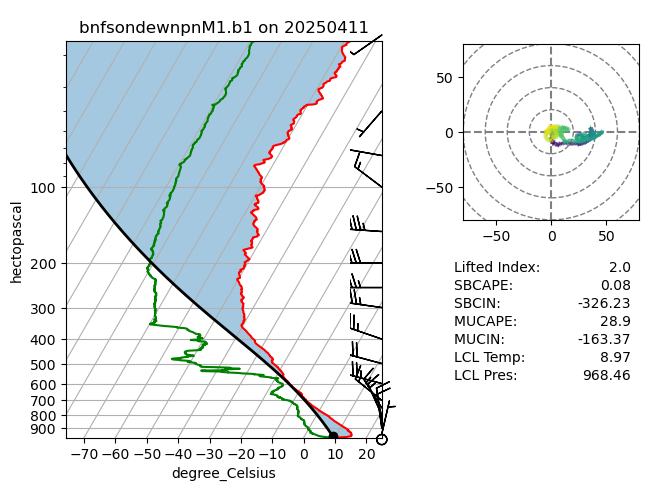

/opt/conda/lib/python3.11/site-packages/act/retrievals/sonde.py:179: UserWarning: Interpolation point out of data bounds encountered
  lfc = mpcalc.lfc(p_sorted[0], t_sorted[0], td_sorted[0])


<xarray.DataArray 'pblht_liu_liang' ()> Size: 8B
array(516.20001221)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Liu-Liang
<xarray.DataArray 'pblht_heffter' ()> Size: 4B
array(306.1, dtype=float32)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Heffter


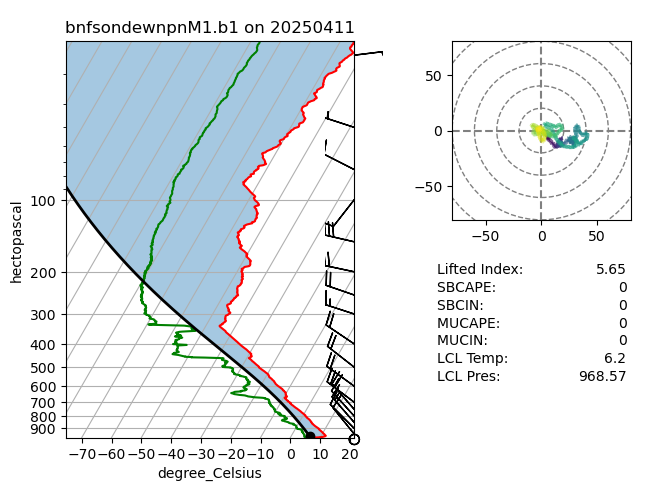

/opt/conda/lib/python3.11/site-packages/act/plotting/skewtdisplay.py:419: UserWarning: Duplicate pressure(s) [18.479999542236328] hPa provided. Output profile includes duplicate temperatures as a result.
  prof = mpcalc.parcel_profile(p, T[0], Td[0]).to('degC')
/opt/conda/lib/python3.11/site-packages/act/retrievals/sonde.py:179: UserWarning: Interpolation point out of data bounds encountered
  lfc = mpcalc.lfc(p_sorted[0], t_sorted[0], td_sorted[0])


<xarray.DataArray 'pblht_liu_liang' ()> Size: 4B
array(3568., dtype=float32)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Liu-Liang
<xarray.DataArray 'pblht_heffter' ()> Size: 4B
array(3568., dtype=float32)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Heffter


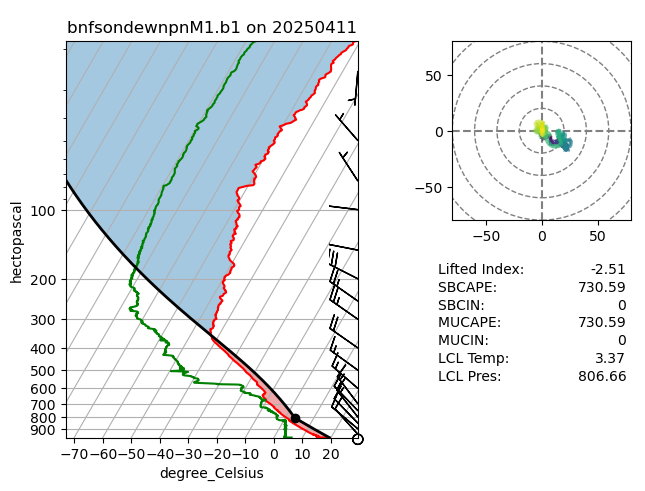

/opt/conda/lib/python3.11/site-packages/act/plotting/skewtdisplay.py:419: UserWarning: Duplicate pressure(s) [19.450000762939453] hPa provided. Output profile includes duplicate temperatures as a result.
  prof = mpcalc.parcel_profile(p, T[0], Td[0]).to('degC')
/opt/conda/lib/python3.11/site-packages/act/retrievals/sonde.py:179: UserWarning: Interpolation point out of data bounds encountered
  lfc = mpcalc.lfc(p_sorted[0], t_sorted[0], td_sorted[0])


<xarray.DataArray 'pblht_liu_liang' ()> Size: 4B
array(466.4, dtype=float32)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Liu-Liang
<xarray.DataArray 'pblht_heffter' ()> Size: 4B
array(379.2, dtype=float32)
Attributes:
    units:      m
    long_name:  Planteary Boundary Layer Height Heffter


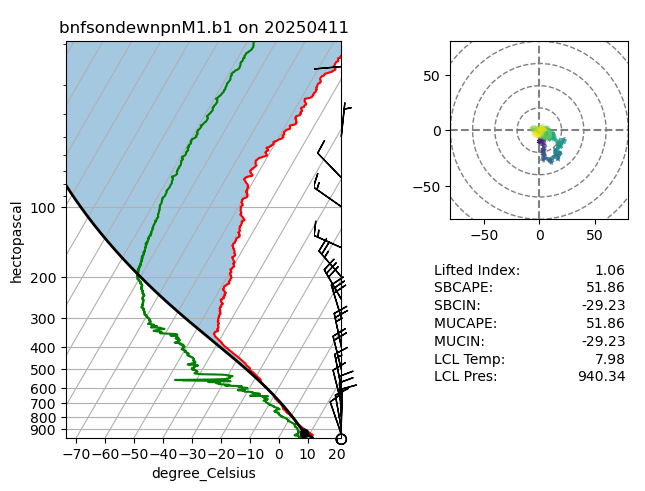

In [46]:
# Read data
filename_sonde = '/data/home/jcai/blimp/bnfsondewnpnM1.b1/bnfsondewnpnM1.b1.20250411.053000.cdf'
ds = act.io.arm.read_arm_netcdf(filename_sonde)
# Plot enhanced Skew-T plot
display = act.plotting.SkewTDisplay(ds)
display.plot_enhanced_skewt(color_field='alt')
act.retrievals.calculate_pbl_liu_liang(ds, temperature='tdry', pressure='pres', windspeed='wspd', height='alt', 
                                       smooth_height=3, land_parameter=True, llj_max_alt=1500.0, llj_max_wspd=2.0)
act.retrievals.calculate_pbl_heffter(ds, temperature='tdry', pressure='pres', height='alt', smooth_height=3, base=5.0)
print(ds['pblht_liu_liang'])
print(ds['pblht_heffter'])
ds.close()
plt.show()

# Read data
filename_sonde = '/data/home/jcai/blimp/bnfsondewnpnM1.b1/bnfsondewnpnM1.b1.20250411.113000.cdf'
ds = act.io.arm.read_arm_netcdf(filename_sonde)
# Plot enhanced Skew-T plot
display = act.plotting.SkewTDisplay(ds)
display.plot_enhanced_skewt(color_field='alt')
act.retrievals.calculate_pbl_liu_liang(ds, temperature='tdry', pressure='pres', windspeed='wspd', height='alt', 
                                       smooth_height=3, land_parameter=True, llj_max_alt=1500.0, llj_max_wspd=2.0)
act.retrievals.calculate_pbl_heffter(ds, temperature='tdry', pressure='pres', height='alt', smooth_height=3, base=5.0)
print(ds['pblht_liu_liang'])
print(ds['pblht_heffter'])
ds.close()
plt.show()

# Read data
filename_sonde = '/data/home/jcai/blimp/bnfsondewnpnM1.b1/bnfsondewnpnM1.b1.20250411.173000.cdf'
ds = act.io.arm.read_arm_netcdf(filename_sonde)
# Plot enhanced Skew-T plot
display = act.plotting.SkewTDisplay(ds)
display.plot_enhanced_skewt(color_field='alt')
act.retrievals.calculate_pbl_liu_liang(ds, temperature='tdry', pressure='pres', windspeed='wspd', height='alt', 
                                       smooth_height=3, land_parameter=True, llj_max_alt=1500.0, llj_max_wspd=2.0)
act.retrievals.calculate_pbl_heffter(ds, temperature='tdry', pressure='pres', height='alt', smooth_height=3, base=5.0)
print(ds['pblht_liu_liang'])
print(ds['pblht_heffter'])
ds.close()
plt.show()

# Read data
filename_sonde = '/data/home/jcai/blimp/bnfsondewnpnM1.b1/bnfsondewnpnM1.b1.20250411.233000.cdf'
ds = act.io.arm.read_arm_netcdf(filename_sonde)
# Plot enhanced Skew-T plot
display = act.plotting.SkewTDisplay(ds)
display.plot_enhanced_skewt(color_field='alt')
act.retrievals.calculate_pbl_liu_liang(ds, temperature='tdry', pressure='pres', windspeed='wspd', height='alt', 
                                       smooth_height=3, land_parameter=True, llj_max_alt=1500.0, llj_max_wspd=2.0)
act.retrievals.calculate_pbl_heffter(ds, temperature='tdry', pressure='pres', height='alt', smooth_height=3, base=5.0)
print(ds['pblht_liu_liang'])
print(ds['pblht_heffter'])
ds.close()
plt.show()